# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

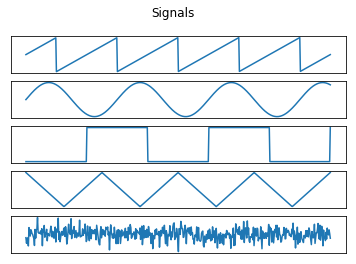

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    return A @ S

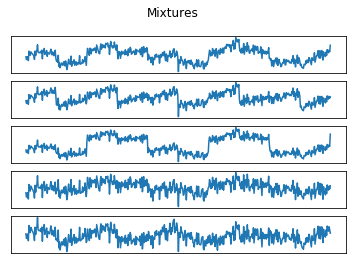

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

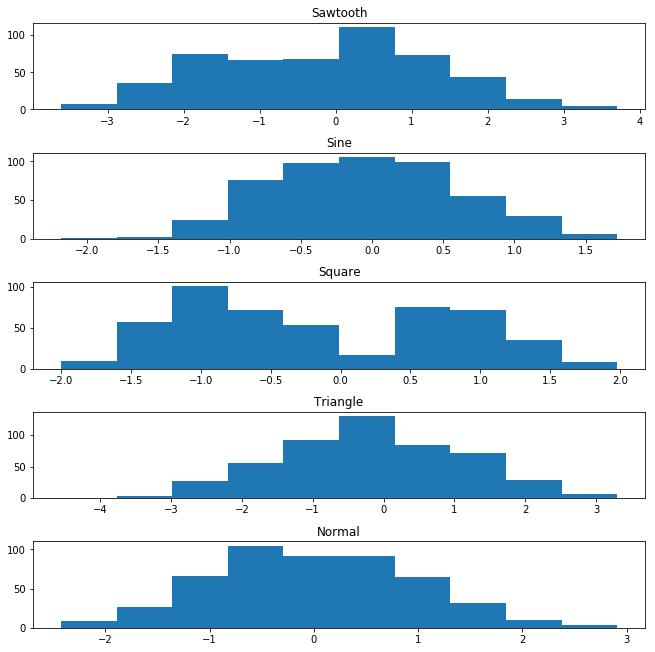

In [5]:
### 1.2 Histogram
pos = 1
signals = ["Sawtooth", "Sine", "Square", "Triangle", "Normal"]
signal_fig = plt.figure(figsize=(10, 10))
for i, signal in enumerate(X):
    signal_fig.add_subplot(num_sources, 1, pos)
    plt.hist(signal)
    plt.title(signals[i])
    pos +=1
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.5,wspace=0.35)

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

***
Firsts of all, comparing to the original distributions, all mixed distributions look more like Gaussians. This is due to the fact that the sum of independent random variables with finite variance tends toward a Gaussian. This is also known as the famour Central Limit Theorem.

Comparing between the distribtuions, we observe some differences, but we are not sure if these are meaningful, since the mising is done uniformly across all signals. We proceed with some speculation on the reasons why this might be.

The last signal's distribution is closest to the Gaussian distribution since it is sampled for that same distribtion. The second closest is the sine wave, and the triangle wave comes in third. THe sawtooth and square are not close in any way to a Gaussian distribution. This could be explained as follows. For example, the sine wave has only a few positive and negative peaks, with most values lying in the middle. Since the function transitions smoothly and slowly from maximum to minimum, the distribution has a very wide peak. In the case of the triangle, because transitions are much more sudden, the distribution peak is much more narrow. On the other extreme is the square wave, which presents to modes, around the minimum and maximum values because the wave is either at one of those values but never in between. 

Of course, the reason why the histograms do not match the theoretical ditributions of the waves is that we have mixed those signals using a random matrix so they are no longer pure, but a discernable pattern exists.
***

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

***
$$
\phi_0(a) = -\tanh(a) \Rightarrow \ln p_0(a) = - \int \tanh(a) da = - \ln \cosh(a) + \mathcal{C} \Rightarrow p_0(a) \propto \frac{1}{\cosh(a)} \propto \frac{2}{e^{a} + e^{-a}}
$$
***
$$
\phi_1(a) = -a + \tanh(a) \Rightarrow \ln p_1(a) = \int \tanh(a)da - \int a da = \ln \cosh(a) - \frac{a^2}{2} + \mathcal{C} \Rightarrow p_1(a) \propto e^{-\frac{a^2}{2}} \cosh(a) \propto \frac{1}{2} e^{-\frac{a^2}{2}}({e^{a}+e^{-a}})
$$
***
$$
\phi_2(a) = -a^3 \Rightarrow \ln p_2(a) = - \int a^3 da = -\frac{a^4}{4} + \mathcal{C} \Rightarrow p_2(a) \propto e^{-\frac{a^4}{4}}
$$
***
$$
\phi_3(a) = -\frac{6a}{a^2 + 5} \Rightarrow \ln p_3(a) = - \int \frac{6a}{a^2 + 5} da = -3 \int \frac{2a}{a^2 + 5} da = -3 \int \frac{1}{a^2 + 5} \frac{d(a^2+5)}{da} da = -3 \ln\left(a ^ 2+5 \right) + \mathcal{C} \\ \Rightarrow p_3(a) \propto \frac{1}{(a^2 + 5)^3}
$$
***


In [6]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    return 2 / (np.exp(a) + np.exp(-a))

In [7]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    return 1/2 * np.exp(-1/2 * a**2) * (np.exp(a)+ np.exp(-a))

In [8]:
def phi_2(a):
    return -a**3

def p_2(a):
    return np.exp(-1/4 * a**4)

In [9]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    return 1/(a**2 + 5)**3

In [10]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

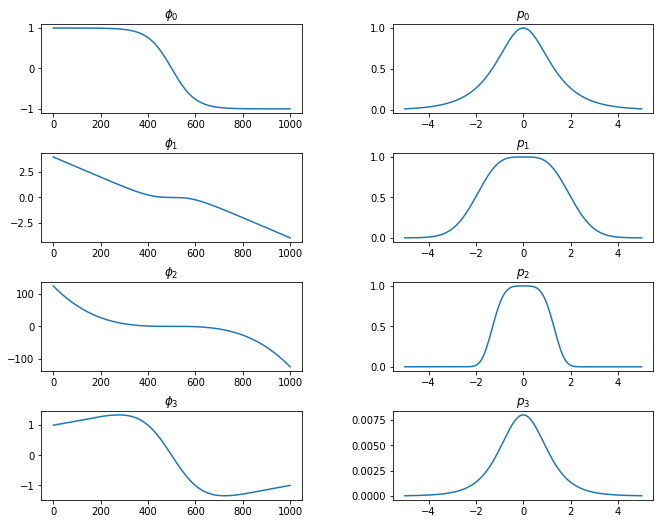

In [11]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

activation_names = [r'$\phi_0$', r'$\phi_1$', r'$\phi_2$', r'$\phi_3$']
prior_names = [r'$p_0$', r'$p_1$', r'$p_2$', r'$p_3$']
pos = 1
prior_fig = plt.figure(figsize=(10, 10))
for i in range(len(activation_functions)):
    ax = prior_fig.add_subplot(5,2, pos)
    ax.set_title(activation_names[i])
    ax.plot(activation_functions[i](a))
    
    ax = prior_fig.add_subplot(5,2, pos+1)
    ax.set_title(prior_names[i])
    ax.plot(a, priors[i](a))

    
    pos += 2
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.45,wspace=0.35)

***
Comparing the shapes, it seems that $p_2$ resembles most the mixed normal and size waves. $p_0$ and $p_3$ also do, but they are too picked. $p_1$ might fit the mixed sawtooth signal distribution, but not very well. Finally, the mixed signal square signal is not well represented by any of the priors.
***

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [12]:
### 1.4 Whitening
def whiten(X):
    # Transpose first for sanity.
    X = X.T
    
    # demean the data
    zeroX = X - np.mean(X, axis=0)
    # print(zeroX.shape)
    
    # calculate covariance matrix
    covZeroX =  zeroX.T @ zeroX
    #print(covZeroX.shape)

    # calculate eigen values and eigen vectors
    l, V = np.linalg.eigh(covZeroX)
    # print(l.shape, V.shape)
    
    # compute the square root of the inverse of the eigenvalue matrix
    L = np.diag(1 / np.sqrt(l))
    # print(L.shape)

    # compute the whitening matrix
    W = (V @ L) @ V.T
    # print(W.shape)
    
    # whiten the data matrix X using the whitening matrix W. Return transposed matrix for further processing.
    return (X @ W).T

In [13]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

In [14]:
### 1.5 Interpret results of whitening
signal_names = ["sawtooth", "sine wave", "square wave", "traingle wave", "random"]
fig_sets = {
    "signals": {
        "data": S,
        "title": "Signals"
    },
    "measurements": {
        "data": X,
        "title": "Measurements"
    },
    "whitened": {
        "data": Xw,
        "title": "Whitened Measurements"
    }
}

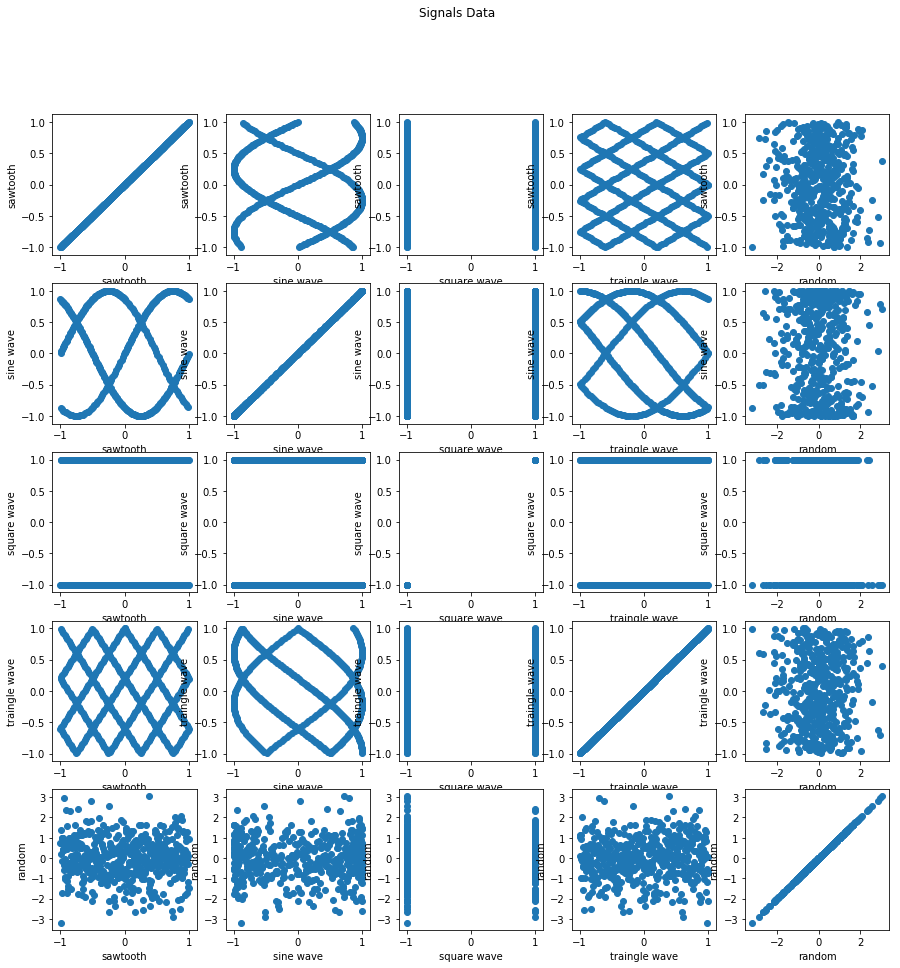

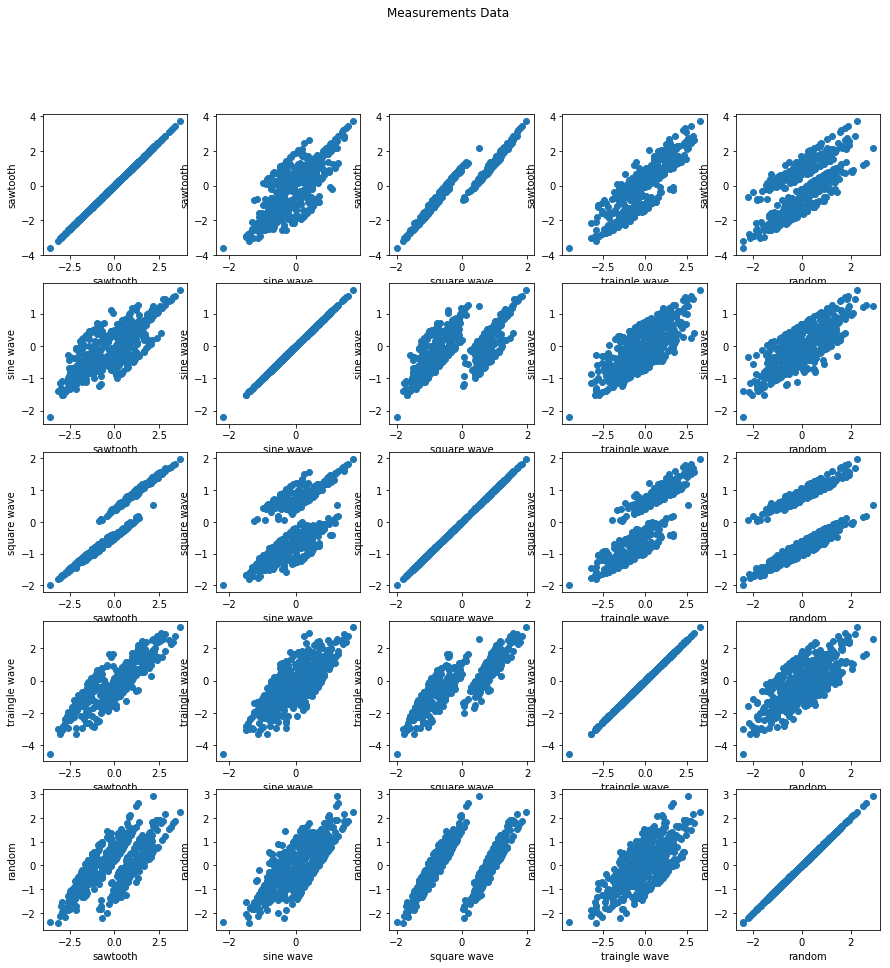

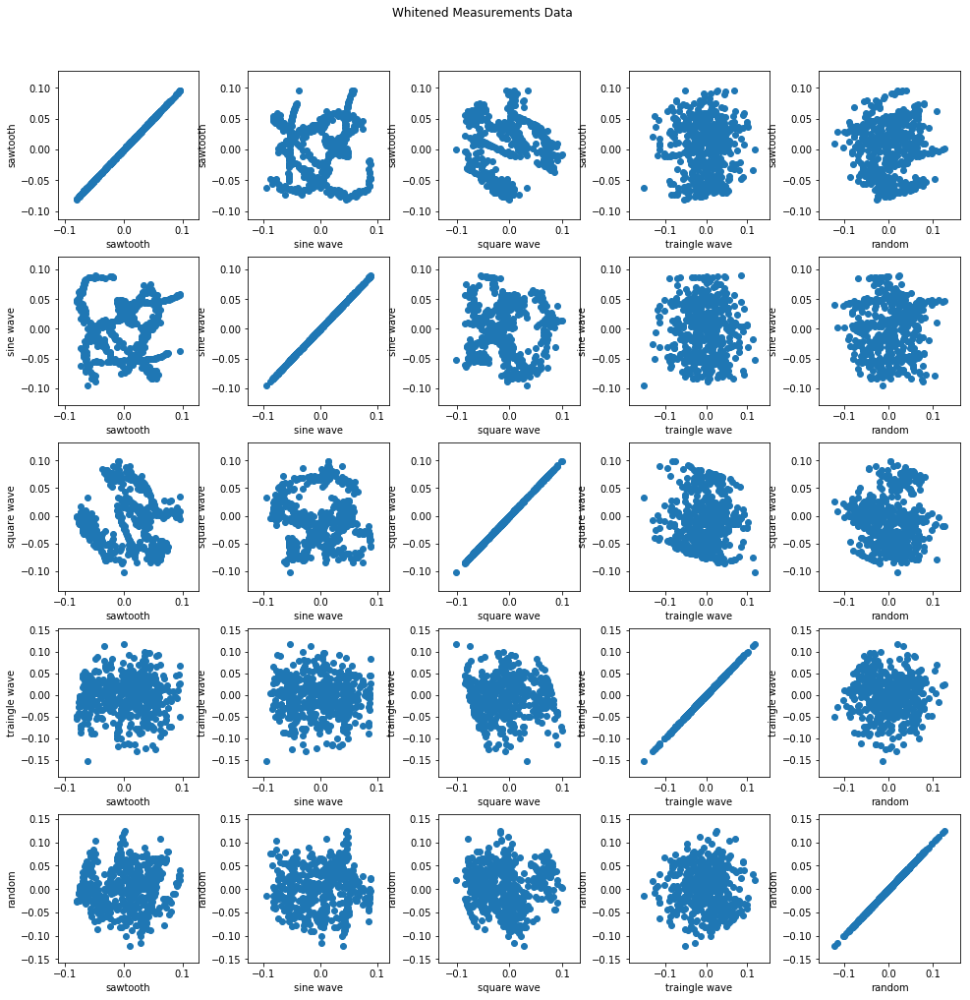

In [15]:
for fig_set in fig_sets.values():
    fig = plt.figure(figsize=(15,15))
    fig.suptitle("{} Data".format(fig_set["title"]))
    for i in range(5):
        for j in range(5):
            ax = fig.add_subplot(num_sources,num_sources, (i+1) + (j*5))
            ax.scatter(fig_set["data"][i], fig_set["data"][j])
            ax.set_xlabel(signal_names[i])
            ax.set_ylabel(signal_names[j])
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.25,wspace=0.35)

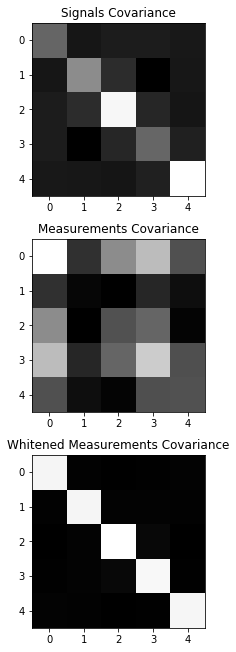

In [16]:
fig = plt.figure(figsize(10,10))
for pos, fig_set in enumerate(fig_sets.values()):
    ax = fig.add_subplot(3,1, pos+1)
    ax.set_title("{} Covariance".format(fig_set["title"]))
    C = fig_set["data"] @ fig_set["data"].T
    plt.imshow(C, cmap='gray', interpolation='nearest')
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.25,wspace=0.35)

Are the signals independent after whitening?

Yes, signals are independent after whitening. This can be seen in both the scatter plots and the color map of the covariance matrix. On the one hand, the scatter plots look like a cloud of points with no structure, or relation discrenable between them. On the other hand, the covariance matrix of the whitened measurements is diagonal, as shown by the colour map, since only the points on the diagonal are positive (white), while the rest are all close to 0 (black). This also means that the signals are uncorrelated with one another. In both cases, obviously, the signals are perfectly correlated with themselves. Hence, the perfect lines in the scatter plots and the white marks in the covariance colour map.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

First, it is an algorithm that takes into account the covariance. In our algorithm, the update rule uses $ x' = W^TWx$ as opposed to the non covariant form which doesn't use it. This makes the update rule take into account not only the magnitude of the gradient, but how it affects the output distribution.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [17]:
### 1.7 Independent Component Analysis
def ICA(data, activation_function, learning_rate=0.1, steps=10000, batch_sz=-1):
    """
    Perform ICA on data

    Given an activation functions and signals, and training parameters, return the
    separated signals with ICA.

    Parameters
    ----------
    data : matrix(float) shape=(#signals,#timesteps)
        a matrix of the signals
        
    activation function : a function handle
        activation function
        
    learning_rate : float
        e.g. 0.1
        
    steps : int 
        e.g. 10000 
        
    batch_sz : int
        e.g. 100. if batch size is -1 then it we use all the data as the batch
    
    Returns
    -------
    W : matrix(float) shape=(#signals,#signals)
        weight metrix for decomposing mixed signals into principal components

    """
    W = random_nonsingular_matrix(data.shape[0])
    
    for step in range(steps):
        
        if batch_sz == -1:
            batch = data
        else:
            
            samples = np.random.choice(X.shape[1], batch_sz, replace=False)
            batch = data.T[samples]
            #start_idx = np.random.randint(0, X.shape[1]-batch_sz+1)
            #batch = X.T[start_idx:start_idx+batch_sz]
            batch = batch.T
            
        a = W.dot(batch)
        
        z = activation_function(a)
        
        x_d = W.T.dot(a)
        
        grad = W + z.dot(x_d.T)/float(batch.shape[1])
        #grad = W + (z.dot(a.T)/batch.shape[1]).dot(W)
        if np.linalg.norm(grad) < 1e-5:
            print('Terminated quickly ' + str(step))
            break
        
        W = W + learning_rate*(grad)
    print('grad norm ' +str(np.linalg.norm(grad)))
    return W

W_est = ICA(Xw, phi_3)  # Compare with ICA(X)

Terminated quickly 2447
grad norm 9.991660677009325e-06


In [18]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


Terminated quickly 3154
grad norm 9.96647514160794e-06
Terminated quickly 3271
grad norm 9.977173107288462e-06
Terminated quickly 1325
grad norm 9.92528459312845e-06
Terminated quickly 2301
grad norm 9.997371820958477e-06


### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

In [19]:
def mixing_demixing(S, whitening=True, audio=False, steps=10000, learning_rate=0.1, batch_sz=-1):
    """
    Given signals S we mix them and then perform demixing to see how wel ICA does

    Parameters
    ----------
    S : matrix(float) shape=(#signals,#timesteps)
        a matrix of the signals
        
    audio : boolean
        True if data is audio
        
    learning_rate : float
        e.g. 0.1
        
    steps : int 
        e.g. 10000 
        
    batch_sz : int
        e.g. 100. if batch size is -1 then it we use all the data as the batch
    
    """
    np.random.seed(42)
    A = random_nonsingular_matrix(d=S.shape[0])
    X = make_mixtures(S, A)
    
    if whitening:
        X = whiten(X)
        
    plot_signals(X, 'Mixed Signals')
    
    if audio:
        play_signals(X, sample_rate, title="Mixed Signals")

    W_estimates = [ICA(X, activation_function=phi,steps=steps,learning_rate=learning_rate, batch_sz=batch_sz) for phi in activation_functions]
    S_estimates = [W_estimates[idx].dot(X) for idx,_ in enumerate(activation_functions)]

    for idx,phi in enumerate(activation_functions):
        plot_signals(S_estimates[idx], 'Demixed signals '+ phi.__name__)
        
        if audio:
            play_signals(S_estimates[idx], sample_rate, title='Demixed signals '+ phi.__name__)
    return S_estimates

Terminated quickly 2077
grad norm 9.974317283444814e-06
Terminated quickly 2639
grad norm 9.961986038476579e-06
Terminated quickly 1376
grad norm 9.909634729495185e-06
Terminated quickly 2802
grad norm 9.953301280100454e-06


[array([[ 2.43806647,  2.29028977,  2.47363252, ...,  3.91646021,
          3.83231537,  1.6074779 ],
        [ 1.38754928,  1.5794391 ,  1.34396178, ...,  1.94085758,
          2.10769212,  3.35995501],
        [-1.65152064, -3.02180762, -1.83323532, ...,  0.71930778,
         -0.25426407, -0.86401126],
        [ 0.43325258,  0.09345787,  0.31625381, ...,  0.20417469,
          0.0787299 ,  1.15790299],
        [-1.22581963, -0.79907863, -0.97349453, ..., -0.62741108,
         -0.42698253,  1.15587615]]),
 array([[-1.09381657, -2.47480894, -1.30696262, ...,  0.87678266,
         -0.06576544, -1.13099431],
        [ 0.5880858 ,  0.4880878 ,  0.44956248, ...,  0.68871341,
          0.63443291,  0.42253081],
        [ 2.59700361,  2.50016569,  2.51263564, ...,  3.19262706,
          3.23331269,  3.14910352],
        [-0.0034402 ,  0.07492845,  0.16501678, ...,  1.87374799,
          1.82562889,  1.64167837],
        [-1.653034  , -1.65764039, -1.65811139, ..., -1.7221873 ,
         -1.72

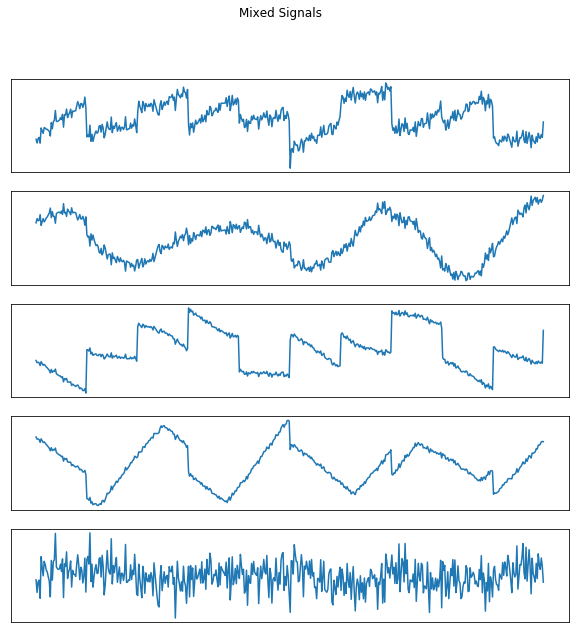

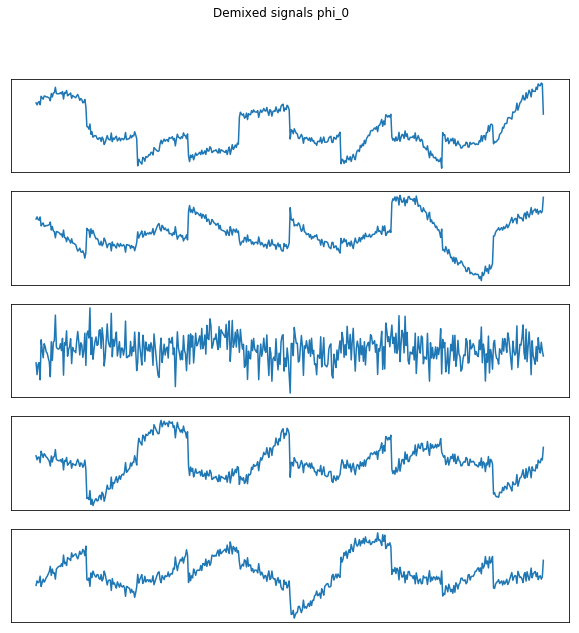

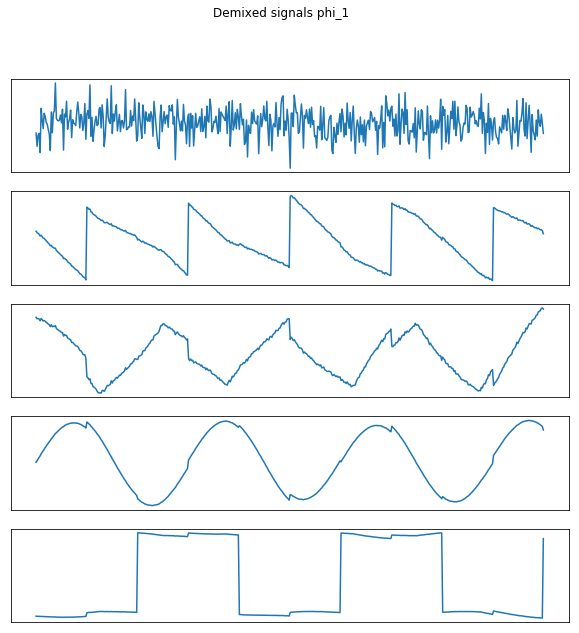

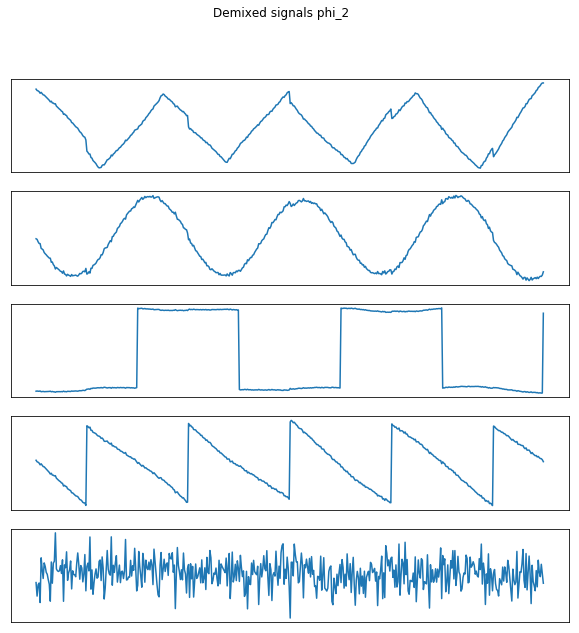

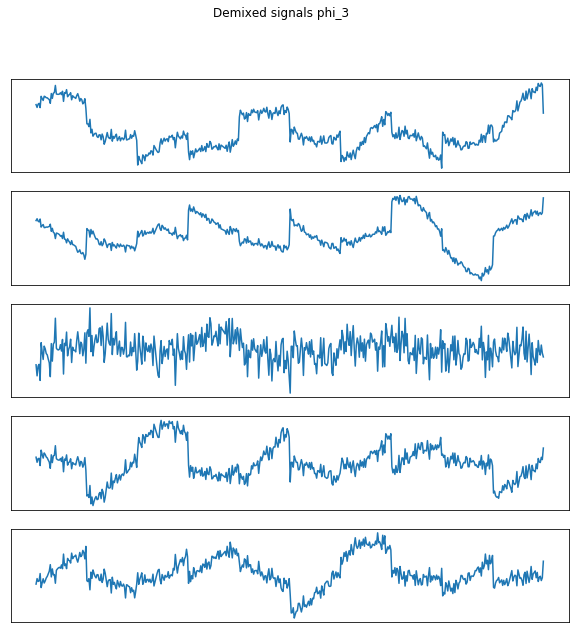

In [20]:
mixing_demixing(X)

In [21]:
def does_whitening_make_a_difference():
    # Does it make a difference (in terms of speed of convergence) 
    # if you whiten your data before running ICA?

    mixing_demixing(X, whitening=False, steps=10000, learning_rate=0.01, batch_sz=500)
    
    return True

grad norm 0.003825707587375135
grad norm 0.0014794348948456687
grad norm nan
grad norm 0.0023909942229487177


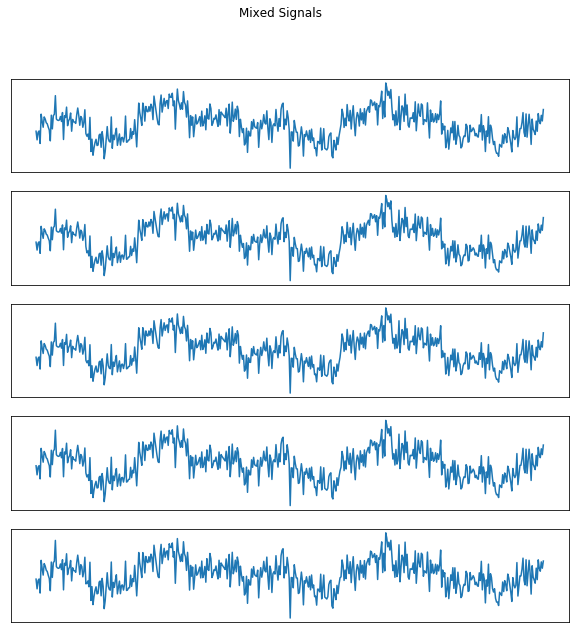

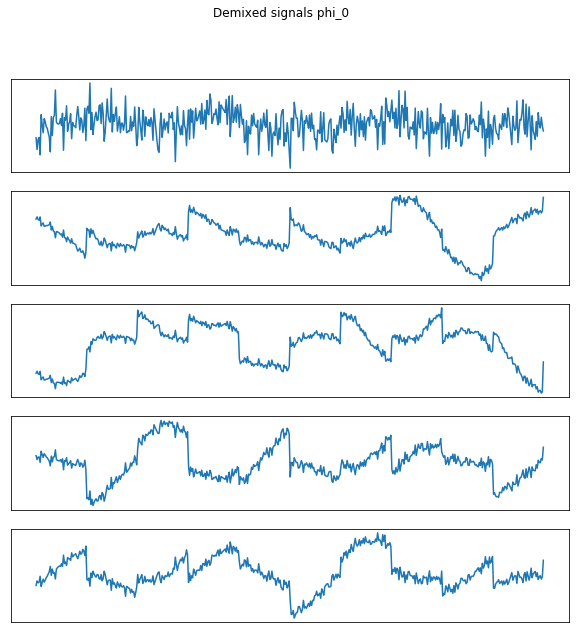

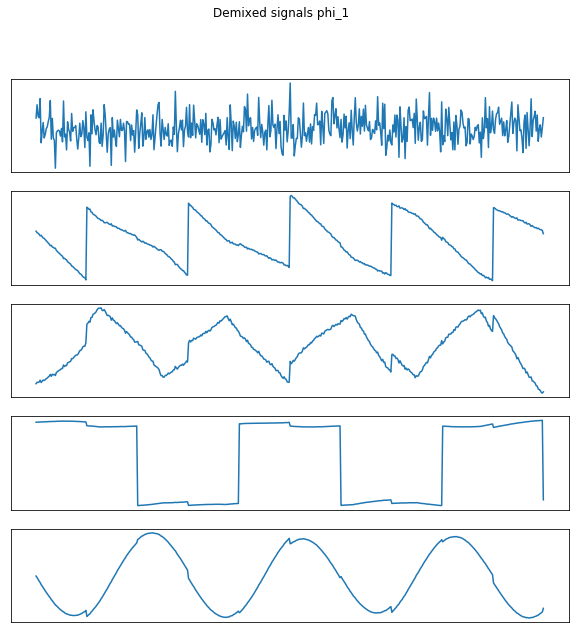

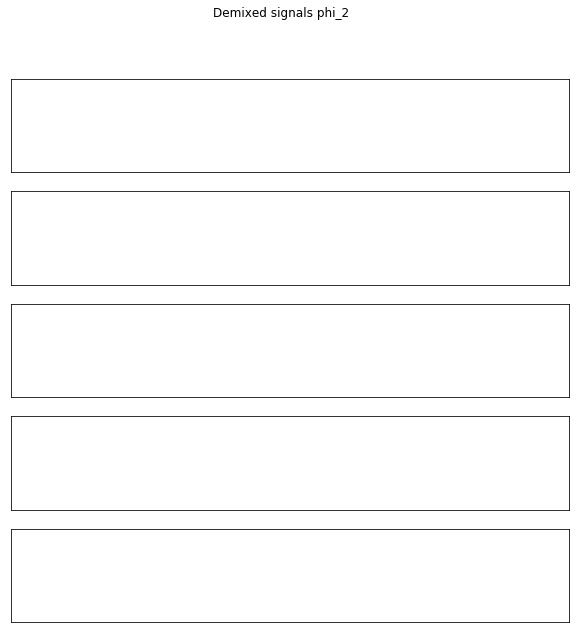

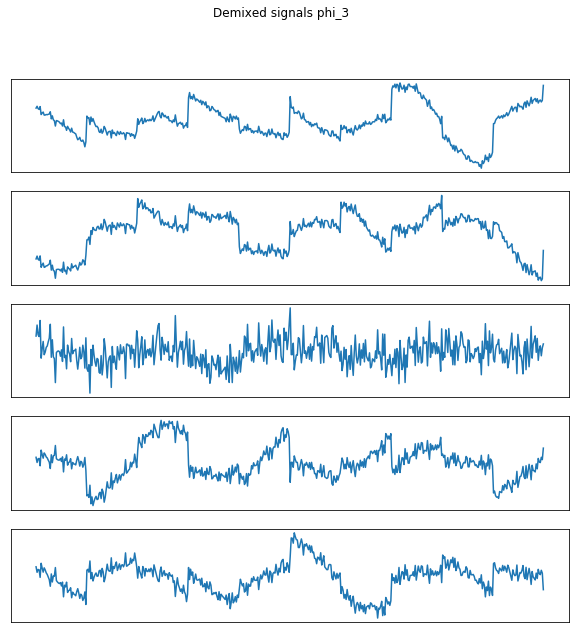

In [22]:
assert type(does_whitening_make_a_difference()) == bool

** Answer **

We can see that convergence is not reached and that without whitening, we might also encounter an overflow (phi2). Whitening definetly makes a difference. 

### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [23]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

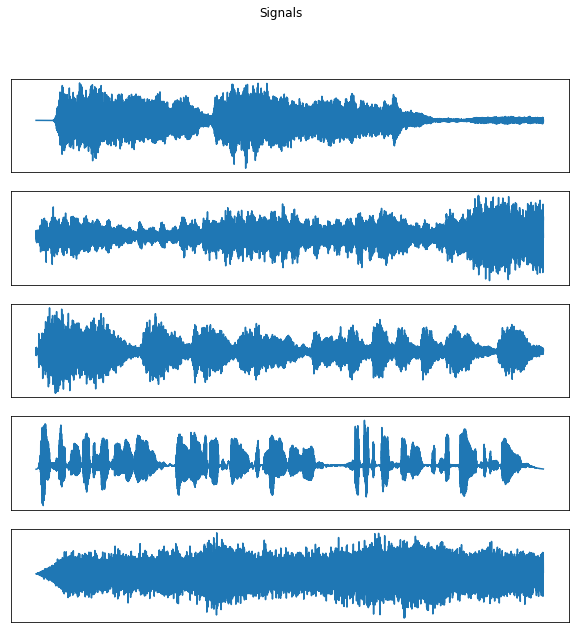

In [24]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

** NOTE ** Jupyter breaks when tryin to display all the graphs and audiso. Therefore, we plot them separately below.

Mixed Signals

Terminated quickly 1194
grad norm 9.863428238671175e-06
Terminated quickly 9060
grad norm 9.994476465219655e-06
Terminated quickly 4253
grad norm 9.975675389375057e-06
Terminated quickly 1095
grad norm 9.997705513442488e-06


Demixed signals phi_0

Demixed signals phi_1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


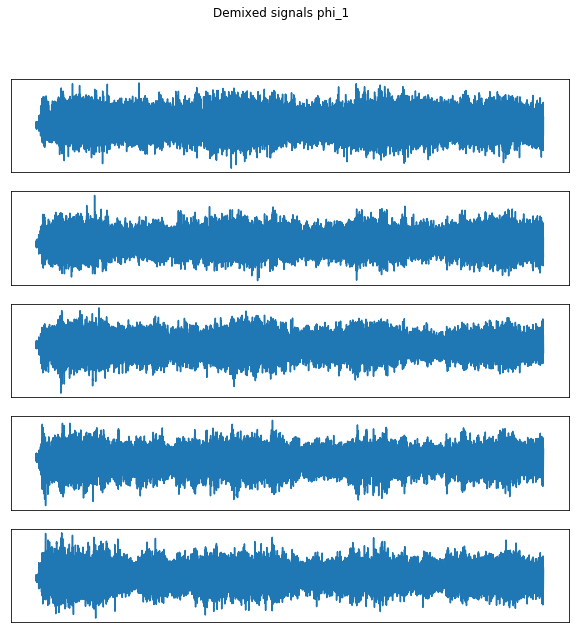

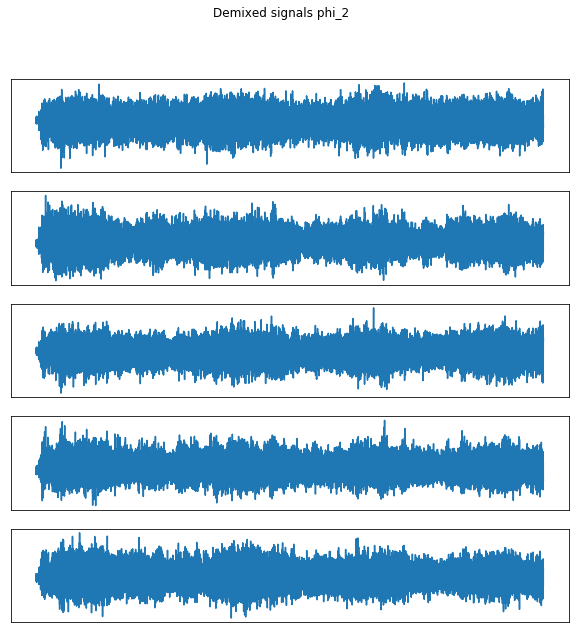

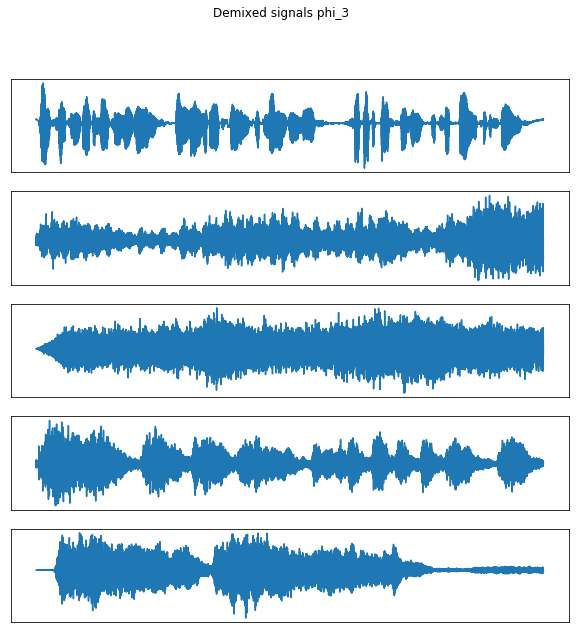

In [25]:
### 1.9 Audio demixing
recoverred_signals = mixing_demixing(S_audio, audio=True)

Demixed signals \phi_0

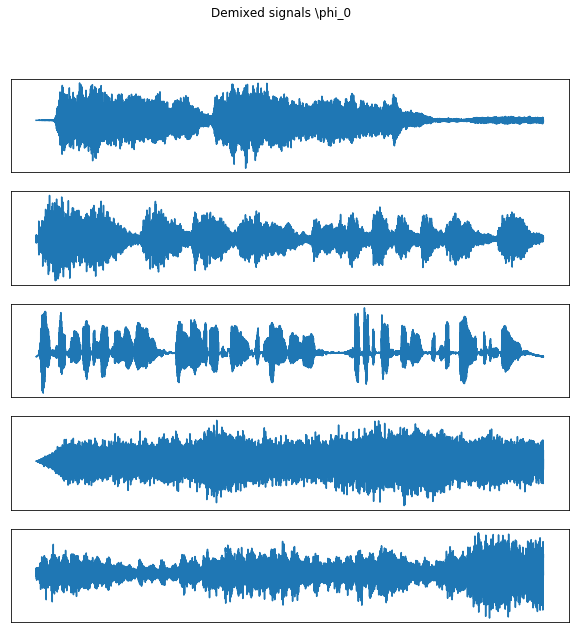

In [32]:
plot_signals(recoverred_signals[0], 'Demixed signals '+ r'\phi_0')
play_signals(recoverred_signals[0], sample_rate, title='Demixed signals '+ r'\phi_0')

Demixed signals \phi_1

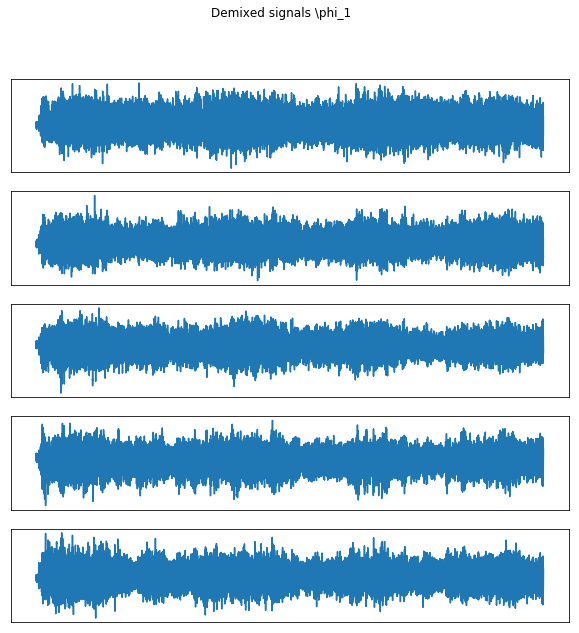

In [33]:
plot_signals(recoverred_signals[1], 'Demixed signals '+ r'\phi_1')
play_signals(recoverred_signals[1], sample_rate, title='Demixed signals '+ r'\phi_1')

Demixed signals \phi_2

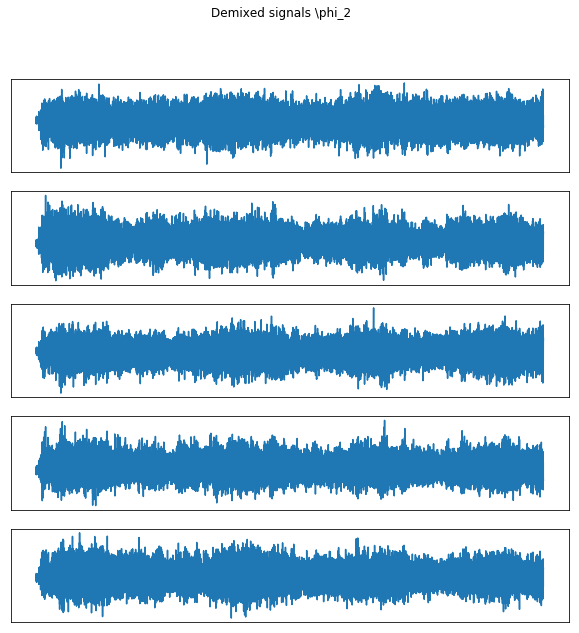

In [34]:
plot_signals(recoverred_signals[2], 'Demixed signals '+ r'\phi_2')
play_signals(recoverred_signals[2], sample_rate, title='Demixed signals '+ r'\phi_2')

Demixed signals \phi_3

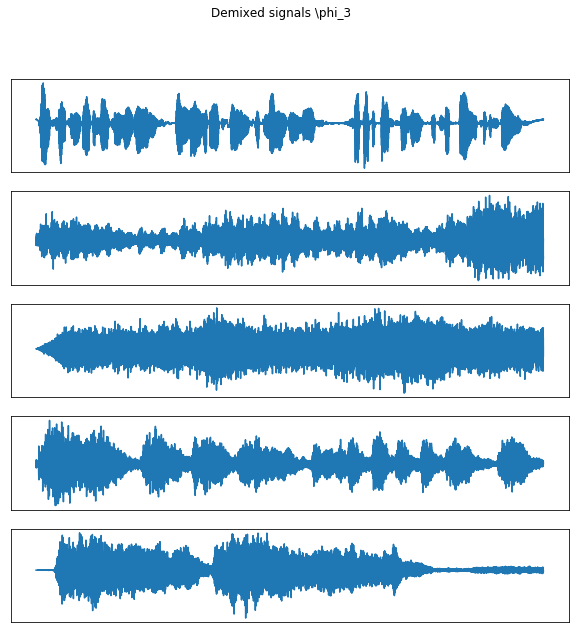

In [35]:
plot_signals(recoverred_signals[3], 'Demixed signals '+ r'\phi_3')
play_signals(recoverred_signals[3], sample_rate, title='Demixed signals '+ r'\phi_3')

Report your results. Using which activation functions ICA recovers the sources?

phi0 and phi3 performed well. phi1 and phi2 did not. We suggest using phi3.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

$C= \int_{-\infty}^{\infty} p(a) da   $

$ \int_{-\infty}^{\infty} p_0(a) da =  \int_{-\infty}^{\infty} \frac{1}{e^{a} + e^{-a}} da = {\pi} \approx 3.141 $

$ \int_{-\infty}^{\infty} p_1(a) da =  \int_{-\infty}^{\infty} \frac{e^{\frac{a^2}{2}}}{e^{a}-e^{-a}} da = \sqrt{2 e \pi} \approx 4.132 $

$ \int_{-\infty}^{\infty} p_2(a) da =  \int_{-\infty}^{\infty} e^{-\frac{a^4}{4}} da = \frac{\Gamma(\frac{1}{4})}{\sqrt(2)} \approx 2.564  $

$ \int_{-\infty}^{\infty} p_1(a) da =  \int_{-\infty}^{\infty} \frac{1}{(a^2+5)^3} da = \frac{3\pi}{8\cdot5^{\frac{5}{2}}} \approx 0.211 $

In [26]:
### Include your answer here (you can use math.gamma if needed)

def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]ty
    norm_c = [3.141, 4.132, 2.564, 0.211]
    
    signal = np.linspace(-5,5,1000)
    
    kurs = []
    for idx,prior in enumerate(priors):
        mu_4 = sum(signal**4*prior(signal)/norm_c[idx]) / len(signal)
        sigma_4 = (sum(signal**2*prior(signal)/norm_c[idx]) / len(signal)) **2
        kurs.append(mu_4/sigma_4)
    return kurs
    

In [27]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[36.78515492569973, 24.983134118183308, 21.908922706839327, 413.4473890301864]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [28]:
### 1.10.2 Excess Kurtosis
import scipy.stats as sts
kurtosis = sts.kurtosis(S.T, fisher=True)
print("synthetic data kurtosis: ")
print (kurtosis)
kurtosis = sts.kurtosis(S_audio.T, fisher=True)
print("audio data kurtosis: ")
print (kurtosis)

synthetic data kurtosis: 
[-1.19640244 -1.48287113 -1.84019701 -1.2000384   0.16989078]
audio data kurtosis: 
[1.79431517 2.06885064 1.93609295 5.05191721 0.53887581]


We can say that the ( due to the negative values ) synthetic data is less prone to outliers ( lighter tail and flatter peaks ). The real data is the opposite, this is expected as natural data has noise that is not generated.